# **Lab 2 - Color Spaces**
__________________________

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Students IDs**

StudentName1: ID1

StudentName2: ID2


**Mount your Google Drive to Colab and change directory to your working directory**

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

# Change path to lab2 directory on your drive
%cd '/content/drive/MyDrive/IMAGE PROCESSING LAB/Lab_2'
%ls
import os
path = os.getcwd()
print('path: ' + path)

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
/content/drive/MyDrive/IMAGE PROCESSING LAB/Lab_2
 BoatsColor.jpg   boats.jpg   Lab2.ipynb   Lab2.pdf   print2pdf.ipynb  'דוח מקדים.pdf'
path: /content/drive/MyDrive/IMAGE PROCESSING LAB/Lab_2


**Import the necessary packages for this lab**

In [ ]:
%matplotlib inline
import numpy as np
import cv2
import matplotlib.pylab as plt
from skimage import transform, io
from skimage.transform import resize, rescale, rotate
from sklearn import cluster
from sklearn.utils import shuffle

##Part 1 - Basic Image Processing Techniques
______________________

Load an image of your choice as **grayscale float64** (use `cv2.imread` to load your image).

In [ ]:



# Load the image as grayscale (default data type is uint8)
img = cv2.imread('boats.jpg', cv2.IMREAD_GRAYSCALE)

# Convert the image to float64 and we convert the support to [0,1] by dividing in 255
img = img.astype(np.float64) / 255

# Display the image data type to confirm
print("Data type:", img.dtype)
print(f"Shape: {img.shape}")
### check that your image was loaded as expected ###
min_value = img.min()
max_value = img.max()
print(f"Minimum value: {min_value}")
print(f"Maximum value: {max_value}")


Data type: float64
Shape: (576, 720)
Minimum value: 0.01568627450980392
Maximum value: 0.8666666666666667


    cv2.imread('your_image.jpg', cv2.IMREAD_GRAYSCALE):
        This loads the image in grayscale mode (1 channel).
        The default data type is uint8 with pixel values in the range 0-255.

    image.astype(np.float64):
        Converts the pixel values from uint8 to float64, allowing for high-precision computations.

    Normalization for Display:
        When displaying a float64 image, you may need to normalize it by dividing by 255.0, so the pixel values are in the range 0-1, as OpenCV expects this range for floating-point images.

### 1. Rescaling

**Question 1.1**

* Resize your image by two scaling factors: $2$ and $\frac{1}{2}$, and using two methods of interpolation: **bilinear** and **nearest neighbor** (in total you should have 4 outputs). Use `resize` or `rescale` from `skimage.transforms` for this part.

* Plot the four images with a relevant title for each. If needed, plot additional, zoomed in plots to better visualize the differernce (e.g. by plotting a 100×100 crop of the image, which can be done using `numpy` slicing).

* Observe the difference between the two methods of interpolation. Explain the results.

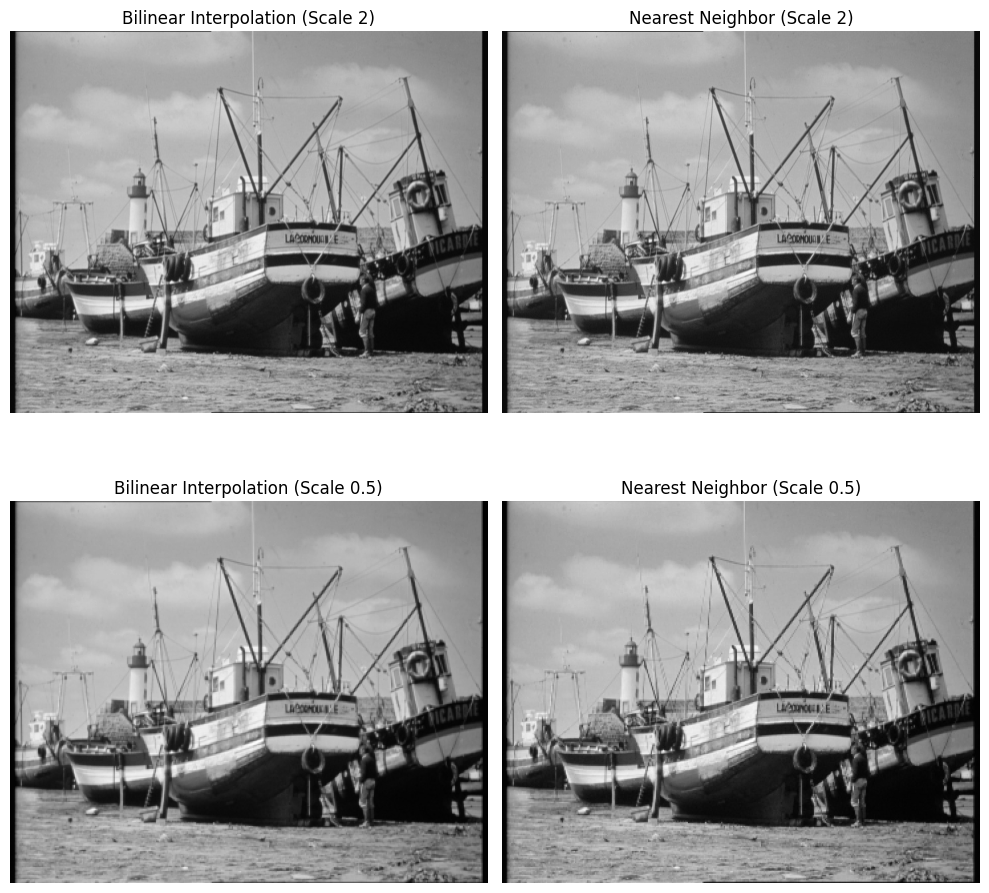

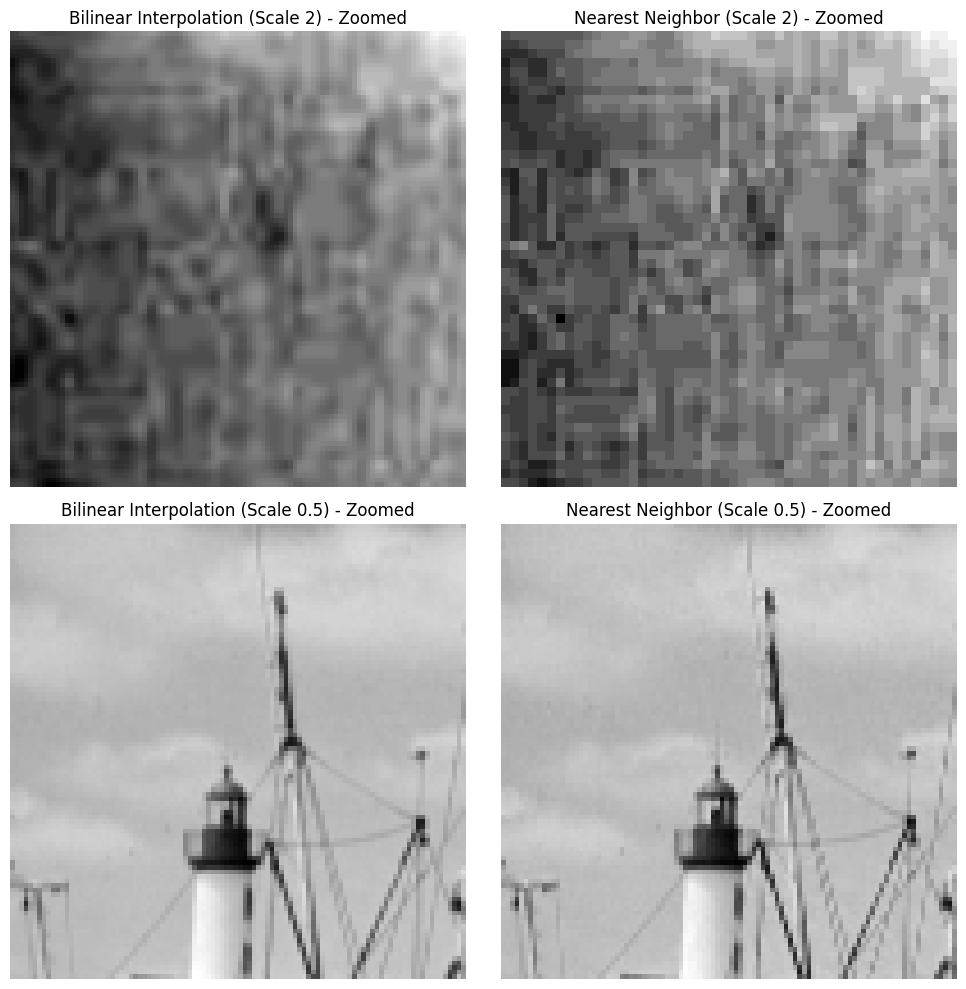

'\nIn the nearest neighbor interpolation, one can see that the transition between pixels is sharp.\nThe image is clearer in the bilinear interpolation case.\n'

In [7]:
# Resize with bilinear interpolation (scale by 2)
img_scaled_2_bilinear = resize(img,
                               (img.shape[0] * 2, img.shape[1] * 2),  # Scaling the dimensions by 2
                               order=1, # bilinear
                               mode='reflect'  # Reflect the borders to avoid edge artifacts
                        )

# Resize with nearest neighbor interpolation (scale by 2)
img_scaled_2_nn = resize(img,
                         (img.shape[0] * 2, img.shape[1] * 2),
                         order=0,
                         mode='reflect'
                  )

# Resize with bilinear interpolation (scale by 0.5)
img_scaled_05_bilinear = resize(img,
                                (int(img.shape[0] * 0.5), int(img.shape[1] * 0.5)),  # Scaling the dimensions by 0.5
                                order=1, # bilinear
                                mode='reflect',
                        )

# Resize with nearest neighbor interpolation (scale by 0.5)
img_scaled_05_nn = resize(img,
                          (int(img.shape[0] * 0.5), int(img.shape[1] * 0.5)),
                          order=0,
                          mode='reflect',
                  )

# Step 3: Plot the four images (resized using different interpolation methods and scaling factors)
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# First row: Scaling by factor 2
axes[0, 0].imshow(img_scaled_2_bilinear, cmap='gray')  # Show bilinear image with scaling factor 2
axes[0, 0].set_title("Bilinear Interpolation (Scale 2)")  # Title for the first subplot
axes[0, 0].axis('off')  # Hide axis for a cleaner look

axes[0, 1].imshow(img_scaled_2_nn, cmap='gray')  # Show nearest neighbor image with scaling factor 2
axes[0, 1].set_title("Nearest Neighbor (Scale 2)")  # Title for the second subplot
axes[0, 1].axis('off')  # Hide axis

# Second row: Scaling by factor 0.5
axes[1, 0].imshow(img_scaled_05_bilinear, cmap='gray')  # Show bilinear image with scaling factor 0.5
axes[1, 0].set_title("Bilinear Interpolation (Scale 0.5)")  # Title for the third subplot
axes[1, 0].axis('off')  # Hide axis

axes[1, 1].imshow(img_scaled_05_nn, cmap='gray')  # Show nearest neighbor image with scaling factor 0.5
axes[1, 1].set_title("Nearest Neighbor (Scale 0.5)")  # Title for the fourth subplot
axes[1, 1].axis('off')  # Hide axis

# Adjust layout to prevent title/labels overlap and display the plot
plt.tight_layout()
plt.show()

# Step 4: To better visualize the differences, let's zoom in on a 100x100 crop of each image.
# We crop a 100x100 region starting at pixel (50, 50) from both the original and resized images.

# Crop from the original image
crop = img[50:150, 50:150]  # Extract a 100x100 region from the original image

# Step 5: Plot the zoomed-in view (100x100 crop) of the four resized images for better comparison.
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Zoomed-in view of bilinear interpolation with scaling factor 2
axes[0, 0].imshow(img_scaled_2_bilinear[50:150, 50:150], cmap='gray')
axes[0, 0].set_title("Bilinear Interpolation (Scale 2) - Zoomed")
axes[0, 0].axis('off')

# Zoomed-in view of nearest neighbor with scaling factor 2
axes[0, 1].imshow(img_scaled_2_nn[50:150, 50:150], cmap='gray')
axes[0, 1].set_title("Nearest Neighbor (Scale 2) - Zoomed")
axes[0, 1].axis('off')

# Zoomed-in view of bilinear interpolation with scaling factor 0.5
axes[1, 0].imshow(img_scaled_05_bilinear[50:150, 50:150], cmap='gray')
axes[1, 0].set_title("Bilinear Interpolation (Scale 0.5) - Zoomed")
axes[1, 0].axis('off')

# Zoomed-in view of nearest neighbor with scaling factor 0.5
axes[1, 1].imshow(img_scaled_05_nn[50:150, 50:150], cmap='gray')
axes[1, 1].set_title("Nearest Neighbor (Scale 0.5) - Zoomed")
axes[1, 1].axis('off')

# Adjust layout for the zoomed-in plots and display them
plt.tight_layout()
plt.show()

"""
In the nearest neighbor interpolation, one can see that the transition between pixels is sharp.
The image is clearer in the bilinear interpolation case.
"""

**Your answer for question 1.1:**


**Question 1.2**

* Resize your image by a scaling factor of $\frac{1}{4}$ using bilinear interpolation:
  - Once **with an anti-aliasing filter**
  - Once **without an anti-aliasing filter** (use `anti_aliasing=False` for this in the `resize` function)
* Show the two output images
* Explain the problem discussed in Part 1, Question 2 of your **preliminary report**. Refer to both images to explain the problem and its solution.

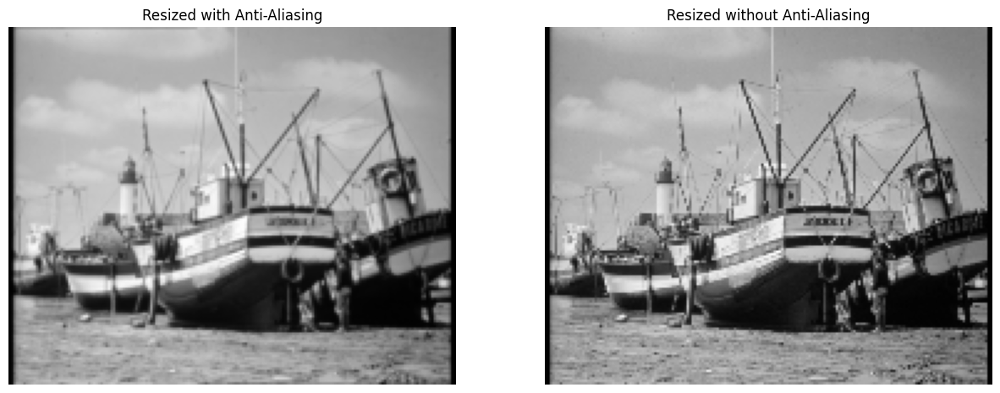

'\nThe image is clearer with anti-aliasing filter.\nThe fast transitions in the image are removed by anti-aliasing filter.\n'

In [9]:

# Scaling factor for downscaling
scale_factor = 0.25

# Resize with bilinear interpolation and anti-aliasing
resized_with_aa = resize(img, (int(img.shape[0] * scale_factor), int(img.shape[1] * scale_factor)), order=1,
                         anti_aliasing=True, mode='reflect')

# Resize with bilinear interpolation without anti-aliasing
resized_without_aa = resize(img, (int(img.shape[0] * scale_factor), int(img.shape[1] * scale_factor)), order=1,
                            anti_aliasing=False, mode='reflect')

# Display the results
fig, axes = plt.subplots(1, 2, figsize=(15, 7))

# Image with anti-aliasing
axes[0].imshow(resized_with_aa, cmap = "gray")
axes[0].set_title('Resized with Anti-Aliasing')
axes[0].axis('off')

# Image without anti-aliasing
axes[1].imshow(resized_without_aa, cmap = "gray")
axes[1].set_title('Resized without Anti-Aliasing')
axes[1].axis('off')

plt.show()
"""
The image is clearer with anti-aliasing filter.
The fast transitions in the image are removed by anti-aliasing filter.
"""

**Your answer to question 1.2:**


**Question 1.3**

1. Write a function that calculates the RMS distance between two images. Use the formula from the lab manual PDF.

  **USE NO LOOPS!!!**

In [10]:
def calc_RMS(f, f_hat):

    # Ensure both images have the same shape
    if f.shape != f_hat.shape:
        raise ValueError("Images must have the same dimensions")

    # Get the dimensions of the images
    M, N = f.shape

    # Calculate the squared differences
    squared_diff = (f - f_hat) ** 2

    # Calculate the sum of squared differences
    sum_squared_diff = np.sum(squared_diff)

    # Normalize by the number of pixels (MN)
    RMS = np.sqrt(sum_squared_diff / (M * N))

    return RMS

2. The function `deflate_inflate(img, scale, method)`, supplied below, shrinks the image, then expands it by the same factor.

  * Apply this function on your image for scale factors of **2, 4, 8, 16, 32**
  * For each scaling factor, calculate the RMS distance between it and the original image.
  * Repeat this process twice:
    * Once for **nearest-neighbor interpolation**
    * Once for **bilinear interpolation**
  * Plot a graph of the RMS error vs. the scaling factor for both mehtods of interpolation (two traces on the same plot). Explain the graph and attach several image examples that support your answer.

In [11]:
### Supplied function ###
def deflate_inflate(img, scale, method):
  m,n = img.shape
  img_shrink = transform.rescale(img, 1.0/scale , order=method)
  return transform.resize(img_shrink, (m,n), order=method)

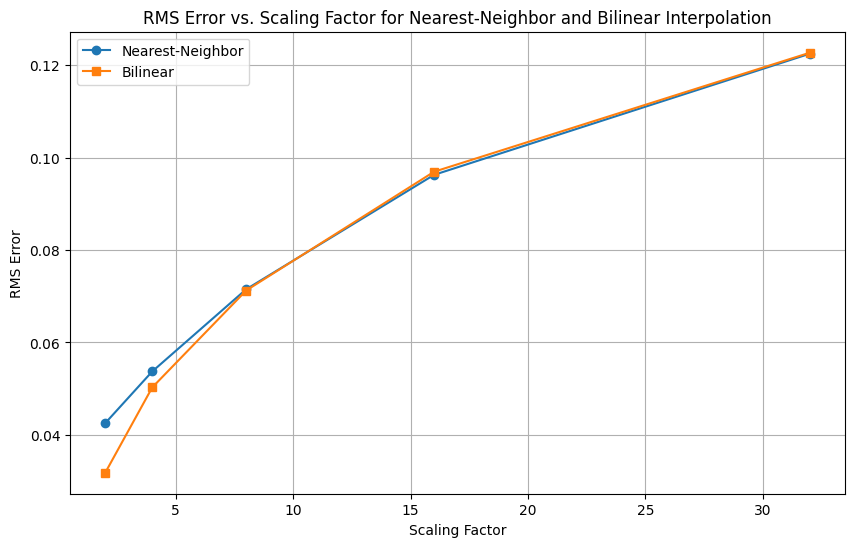

'In the low scales, the RMS error of the bilinear method is smaller than the error of the nearest neighbor method, as one can see previously.'

In [14]:
### Write your code here ###
# Assuming img is your input image
scales = [2, 4, 8, 16, 32]
rms_nearest = []
rms_bilinear = []

# Compute RMS for nearest-neighbor interpolation
for scale in scales:
    inflated_nn = deflate_inflate(img, scale, method=0)  # Nearest-Neighbor (order=0)
    rms_nn = calc_RMS(img, inflated_nn)
    rms_nearest.append(rms_nn)

# Compute RMS for bilinear interpolation
for scale in scales:
    inflated_bl = deflate_inflate(img, scale, method=1)  # Bilinear (order=1)
    rms_bl = calc_RMS(img, inflated_bl)
    rms_bilinear.append(rms_bl)



    # Plot the RMS error vs. scaling factor for both methods
plt.figure(figsize=(10, 6))
plt.plot(scales, rms_nearest, label='Nearest-Neighbor', marker='o')
plt.plot(scales, rms_bilinear, label='Bilinear', marker='s')
plt.xlabel('Scaling Factor')
plt.ylabel('RMS Error')
plt.title('RMS Error vs. Scaling Factor for Nearest-Neighbor and Bilinear Interpolation')
plt.legend()
plt.grid(True)
plt.show()

"In the low scales, the RMS error of the bilinear method is smaller than the error of the nearest neighbor method, as one can see previously."

**Your answer to question 1.3:**


### 2. Rotation

**Question 2.1**

* Rotate your image by $30^{\circ}$, $60^{\circ}$ and $-45^{\circ}$, and using two methods of interpolation: **bilinear** and **nearest neighbor** (in total you should have 6 outputs). Use `rotate` from `skimage.transforms` for this part.

* Plot the six images with a relevant title for each. If needed, plot additional, zoomed in plots to better visualize the differernce (e.g. by plotting a 100×100 crop of the image, which can be done using `numpy` slicing).

* Observe the difference between the two methods of interpolation. Explain why interpolation is needed when rotating an image.

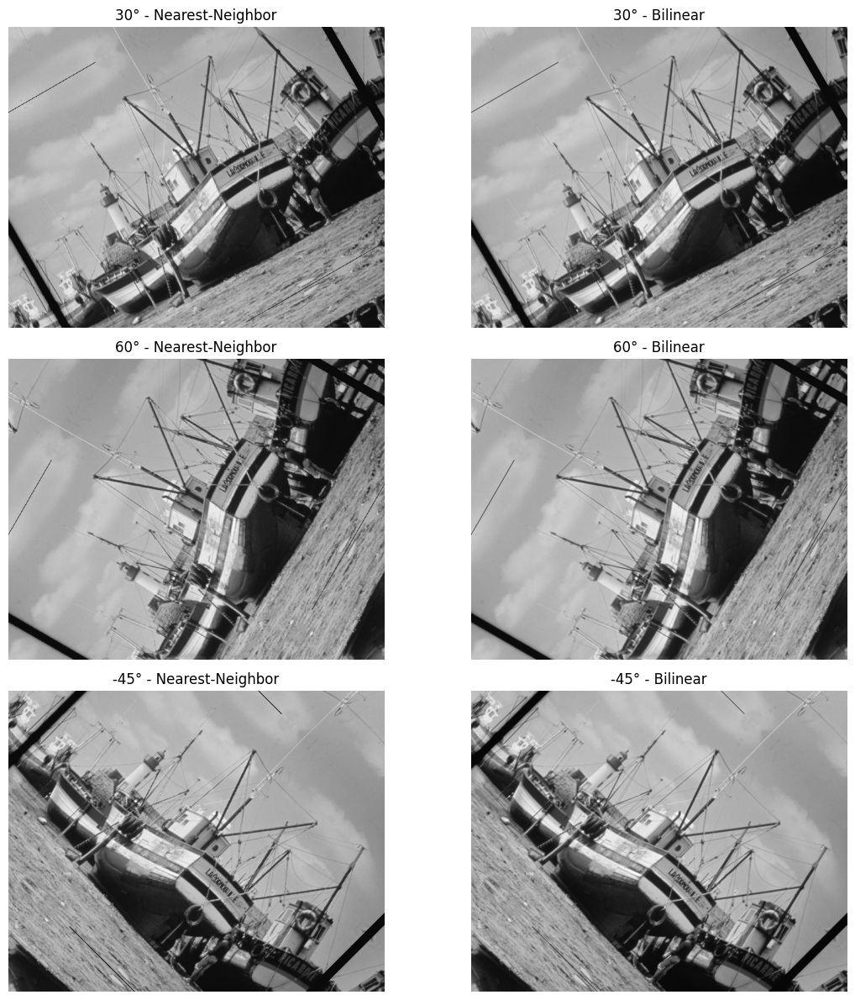

In [ ]:
### Write your code here ###
# Define the angles for rotation
angles = [30, 60, -45]

# Define the interpolation methods (0 for nearest-neighbor, 1 for bilinear)
methods = [0, 1]

# Prepare subplots to display the rotated images
fig, axes = plt.subplots(3, 2, figsize=(12, 12))

# Rotate and plot for both methods and each angle
for i, angle in enumerate(angles):
    for j, method in enumerate(methods):
        # Perform rotation
        rotated_img = transform.rotate(img, angle, mode='reflect', order=method)

        # Plot the result
        ax = axes[i, j]
        ax.imshow(rotated_img, cmap='gray')
        ax.set_title(f'{angle}° - {"Bilinear" if method == 1 else "Nearest-Neighbor"}')
        ax.axis('off')

plt.tight_layout()
plt.show()


**Your answer to question 2.1:**


## Part 2 - Color Spaces
_____________________

Load a **color** image of your choice as **uint8** (use `cv2.imread` to load your image).

Image shape:(576, 787, 3), Image data type:uint8


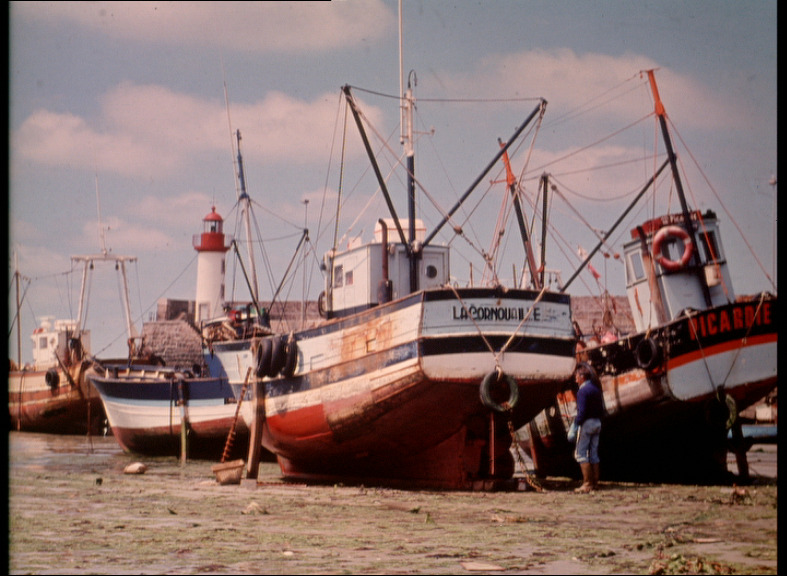

In [16]:
### replace the string with your code ###
img = cv2.imread('BoatsColor.jpg')

# Check that your image was loaded as expected
print(f'Image shape:{img.shape}, Image data type:{img.dtype}')

# Display the image
from google.colab.patches import cv2_imshow
cv2_imshow(img)

**1.** Use the function supplied below to show the original RGB image and to plot each of its channels alongside its histogram.

In [30]:
# Supplied function -
def plot_per_channels(img, color_list, titles):
  plt.imshow(img)
  plt.title('Regular image')
  plt.show()

  b, g, r = img[:,:,0], img[:,:,1], img[:,:,2]
  plt.figure(figsize=(20,15))
  fig, axes = plt.subplots(3, 2)

  for idx_channel, col in enumerate(color_list):
    histr = cv2.calcHist([img[:,:,idx_channel]], [0], None, [256], [0, 255])
    axes[idx_channel, 1].plot(histr,color = col)
    axes[idx_channel, 1].title.set_text(str(titles[idx_channel]))

    axes[idx_channel, 0].imshow(r, cmap='gray')
    axes[idx_channel, 0].title.set_text(str(titles[idx_channel]))

  plt.show()

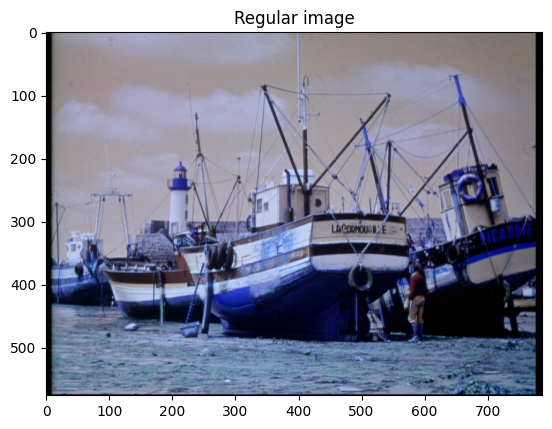

<Figure size 2000x1500 with 0 Axes>

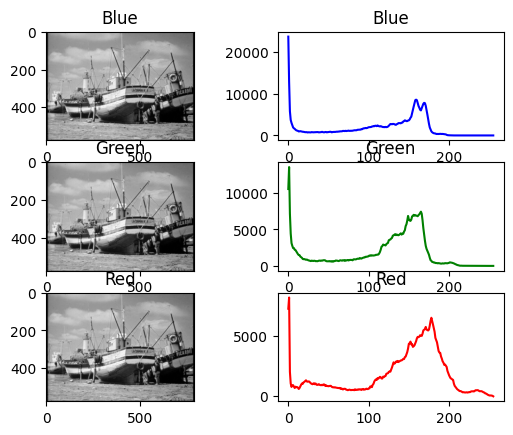

In [31]:
### Write your code here ###
color = ('b','g','r')
titles = ("Blue","Green" ,"Red")
plot_per_channels(img, color, titles)

Answer the following questions:

**1.1.** Does the 'regular' image look as expected? If not, explain why (hint: what color space is the image loaded using `cv2` compared to `matplotlib.pyplot`'s `imshow` function?).

**1.2.** Explain the output graphs and the grayscale images you got.

**Your answer to question 1.1:**
no, because the open cv works in BGR and pyplot works in RGB so the matrices loaded to the wrong places in the plot that's why the image looks different


**Your answer to question 1.2:**
every graph shows the histogram of one of the RGB matrix


**2.** Plot the 'regular' image the correct way (so colors are rendered as expected).

(Note: you can use `cv2.cvtColor` but there are many other correct ways to do this).

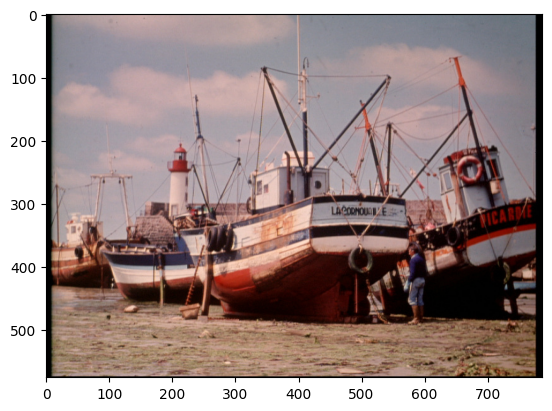

In [21]:
# rgb -> bgr
img_reorder = img[:, :, [2, 1, 0]]
plt.imshow(img_reorder)

**3.** Implement the function `RGB2Grayscale` in the block below. This function receives an RGB image in the input and returns a grayscale version of that image. Make sure your output's `dtype` is **uint8**. Use the formula supplied in the lab for this (it should be close to the formula you have written in your preliminary report).

You may use `cv2.split` in your implementation.

In [ ]:
# Function to convert RGB image to Grayscale
def RGB2Grayscale(img):
    """
    Converts an RGB image to a grayscale image using the formula:
    img_grayscale = 0.299 * R + 0.587 * G + 0.114 * B
    """
    # Split the image into individual color channels
    b, g, r = cv2.split(img)  # OpenCV loads images in BGR format

    # Apply the img_grayscale conversion formula
    img_grayscale = 0.299 * r + 0.587 * g + 0.114 * b

    # Ensure the output is of dtype uint8
    img_grayscale = np.clip(img_grayscale, 0, 255).astype(np.uint8)

    return img_grayscale


Convert your color image to grayscale using the function you implemented. Show the output using `plt.imshow` and verify that the output looks as expected.

(576, 787)


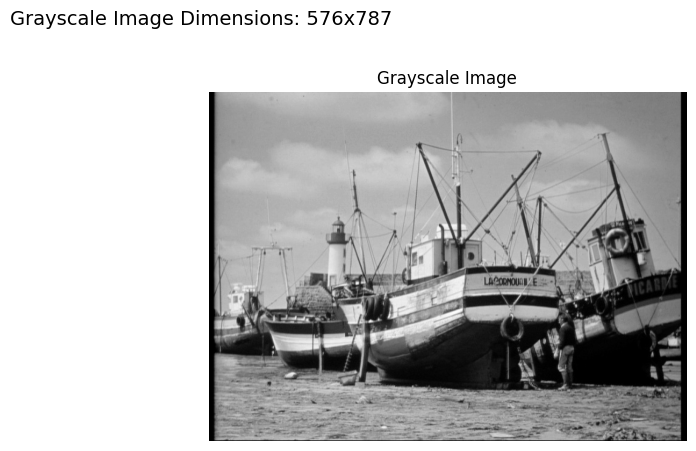

In [ ]:

    # Convert the loaded image to grayscale
    grayscale_img = RGB2Grayscale(img)


    # Display the grayscale image
    plt.figure(figsize=(10, 5))




    # Show the grayscale image
    plt.subplot(1, 2, 2)
    plt.imshow(grayscale_img, cmap='gray')  # Show grayscale image
    plt.title("Grayscale Image")
    plt.axis('off')
    grayscale_dims = grayscale_img.shape
    plt.suptitle(f"Grayscale Image Dimensions: {grayscale_dims[0]}x{grayscale_dims[1]}", fontsize=14)
    plt.tight_layout()
    plt.show()



The shape of grayscale_img is just (height, width), showing that it no longer has a third dimension for color channels, that's why it's a true grayscale image.

**4.** Convert your color image to HSV color space (using `cv2.cvtColor`) and show the result using `plt.imshow`.

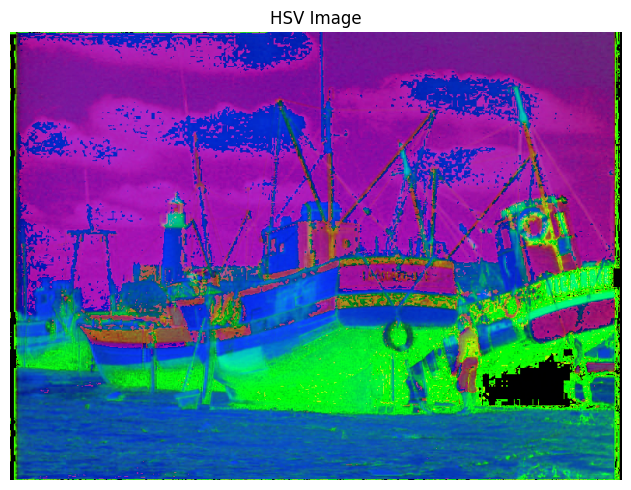

In [33]:

    # Convert the BGR image to HSV color space
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)


    # Display the original and HSV images
    plt.figure(figsize=(10, 5))

    # Show the HSV image
    plt.imshow(hsv_img)  # Display HSV as RGB for visualization
    plt.title("HSV Image")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

**5.**	Show the images and the histograms of the 3 HSV channels. Normalize the horizontal axis according to the standard values of the HSV Color Space.

**NOTE: DO NOT NORMALIZE THE ORIGINAL IMAGE**

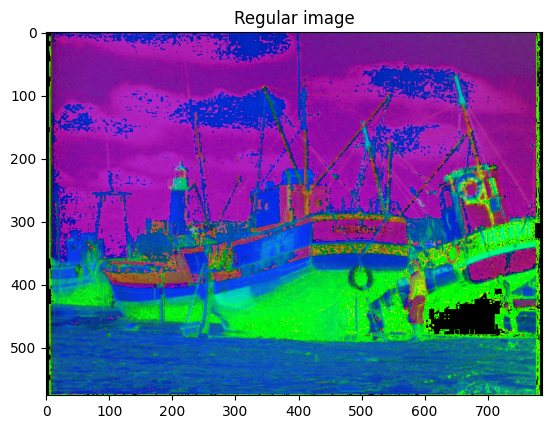

<Figure size 2000x1500 with 0 Axes>

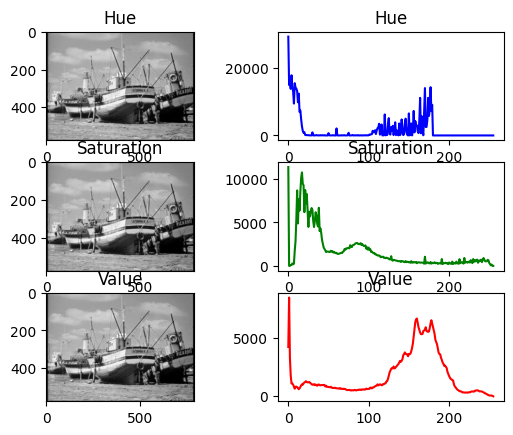

In [34]:
### Write your code here ###
color = ('b','g','r')
titles = ("Hue","Saturation" ,"Value")
plot_per_channels(hsv_img, color, titles)



Explain the results of the histograms and the grayscale images of the channels.

**Your answer to question 5:**
The grayscale images look regular, but their values are not distributed Gaussian.

**6. Color Histogram Equalization**

Use the function `hist_eq_rgb`, supplied below, to perform histogram equalization on your RGB image and to plot the results. This function equalizes each channel separately then combines the equalized channels to a new image.

In [35]:
### Supplied function ###
def hist_eq_rgb(img):
  print("image shape: ", img.shape)
  plt.imshow(img)
  plt.show()
  R, G, B = cv2.split(img)
  R_eq = cv2.equalizeHist(R)
  G_eq = cv2.equalizeHist(G)
  B_eq = cv2.equalizeHist(B)

  fig, ax = plt.subplots(ncols=4, nrows=3, figsize=(30, 20))
  ax[0,0].imshow(R, cmap = 'gray'); ax[0,0].set_title('Red channel')
  ax[1,0].imshow(G, cmap = 'gray'); ax[1,0].set_title('Green channel')
  ax[2,0].imshow(B, cmap = 'gray'); ax[2,0].set_title('Blue channel')
  ax[0,1].hist(R.flatten(),256,[0,255], color = 'r'); ax[0,1].set_title('Red channel histogram')
  ax[1,1].hist(G.flatten(),256,[0,255], color = 'g'); ax[1,1].set_title('Green channel histogram')
  ax[2,1].hist(B.flatten(),256,[0,255], color = 'b'); ax[2,1].set_title('Blue channel histogram')

  ax[0,2].imshow(R_eq, cmap = 'gray'); ax[0,2].set_title('Red channel after histogram equalization')
  ax[1,2].imshow(G_eq, cmap = 'gray'); ax[1,2].set_title('Green channel after histogram equalization')
  ax[2,2].imshow(B_eq, cmap = 'gray'); ax[2,2].set_title('Blue channel after histogram equalization')
  ax[0,3].hist(R_eq.flatten(),256,[0,256], color = 'r');ax[0,3].set_title('Red channel histogram after histogram equalization')
  ax[1,3].hist(G_eq.flatten(),256,[0,256], color = 'g');ax[1,3].set_title('Green channel histogram after histogram equalization')
  ax[2,3].hist(B_eq.flatten(),256,[0,256], color = 'b');ax[2,3].set_title('Blue channel histogram after histogram equalization')

  img_eq = cv2.merge((R_eq,G_eq,B_eq))
  plt.figure()

  plt.imshow(img_eq)
  plt.title('The image after histogram equalization on all 3 layers (R, G, B)')
  plt.show()

image shape:  (576, 787, 3)


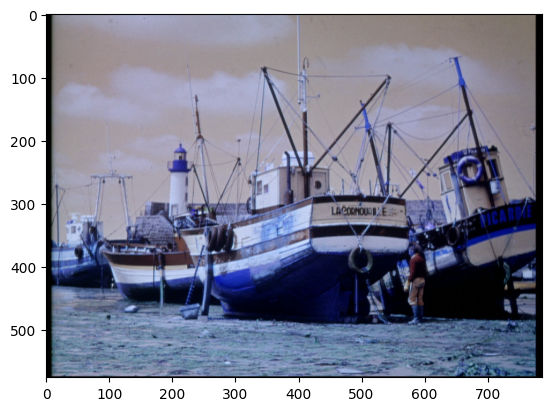

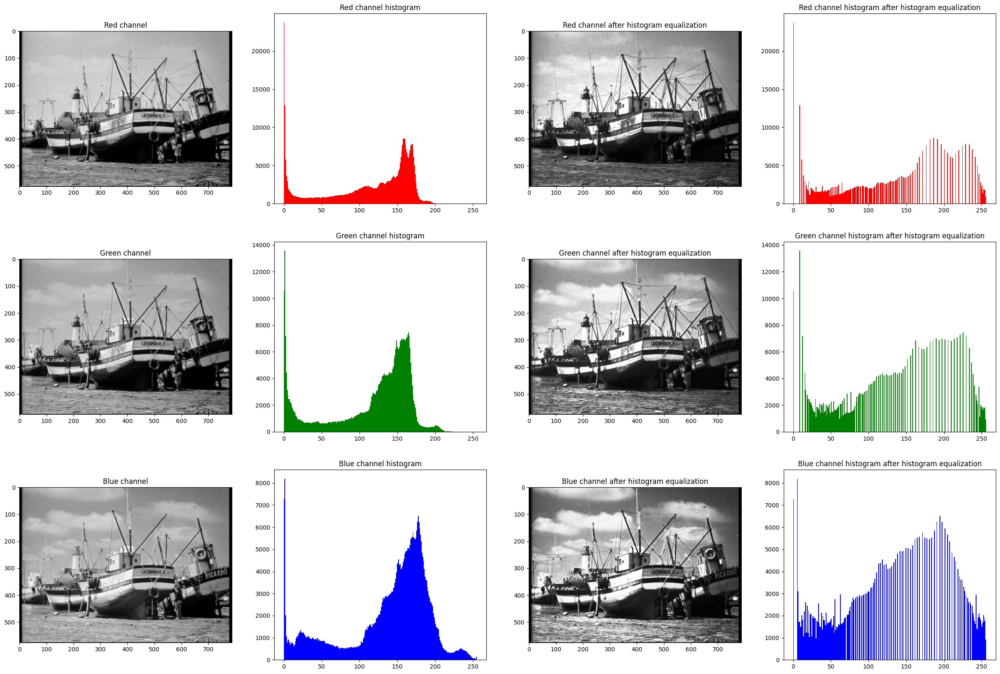

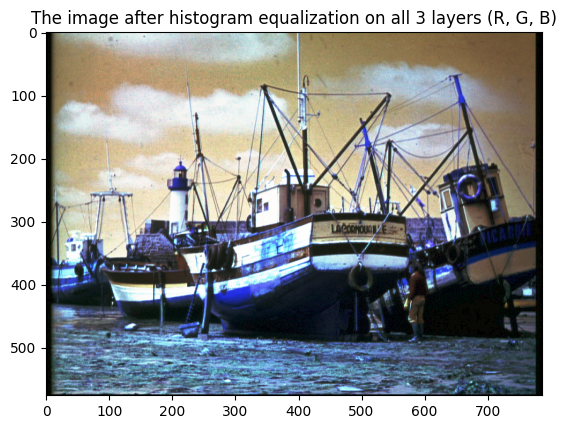

In [36]:
### Write your code here ###
hist_eq_rgb(img)
#plt.imshow(hsv_rgb)
#plt.show()

Explain the results of this function.

**Your answer:** After equalization the histograms made more flat. Therefore weaker area in the image made more strong and vice versa.


**7.** In this section you will need to **read the instructions carefully**.

Our goal is to analyze the consequences of histogram-equalizing each of the one channels of an HSV image **individually** - so you will perform histogram equalization **3 times**, each one on a different channel of the HSV image, **leaving the other two unchanged**.

Plot the **input image** and the **three output images**, with appropriate titles. Remember to convert the HSV images to RGB so the images are displayed correctly.

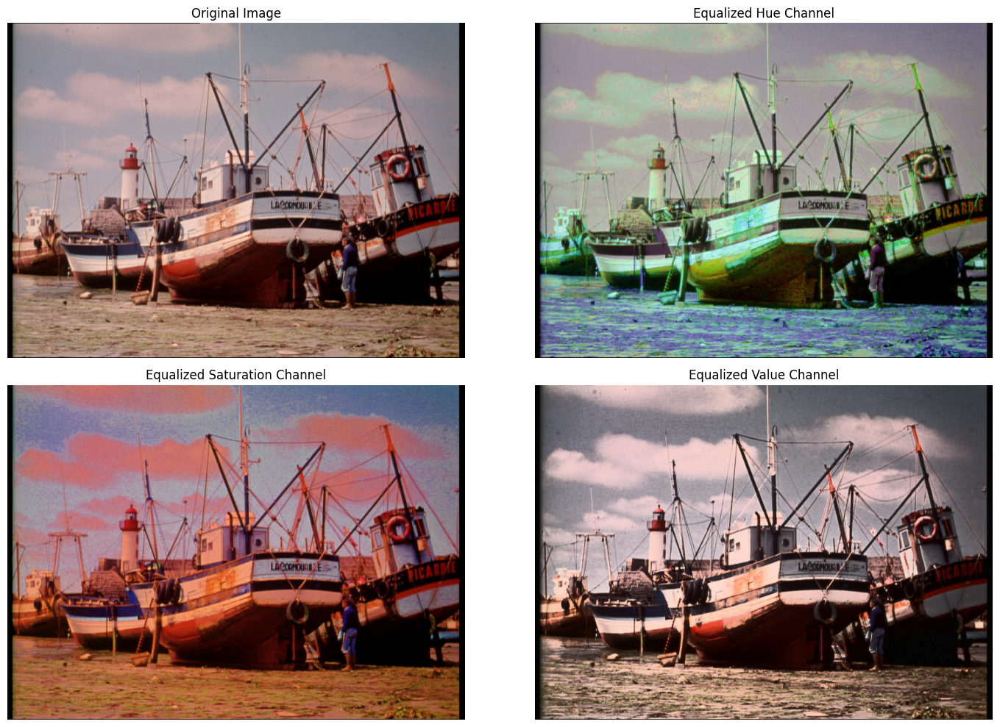

In [37]:
import cv2
import matplotlib.pyplot as plt

def plot_hsv_equalization(img):
    """
    Analyze the consequences of histogram-equalizing each HSV channel individually.
    Plot the original image and the three output images with explanations.
    """
    # Convert the BGR image to HSV color space.
    # OpenCV uses BGR as its default color space, so we first convert to HSV.
    hsv_img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Split the HSV image into its separate channels: Hue, Saturation, and Value.
    # These represent color (H), intensity of the color (S), and brightness (V).
    H, S, V = cv2.split(hsv_img)

    # Perform histogram equalization on each channel individually.
    # This redistributes the pixel intensities to enhance contrast.
    H_eq = cv2.equalizeHist(H)  # Equalize the Hue channel
    S_eq = cv2.equalizeHist(S)  # Equalize the Saturation channel
    V_eq = cv2.equalizeHist(V)  # Equalize the Value channel

    # Reconstruct HSV images by replacing one equalized channel at a time.
    # The other two channels remain unchanged for each case.
    hsv_h_eq = cv2.merge((H_eq, S, V))  # Replace Hue with its equalized version
    hsv_s_eq = cv2.merge((H, S_eq, V))  # Replace Saturation with its equalized version
    hsv_v_eq = cv2.merge((H, S, V_eq))  # Replace Value with its equalized version

    # Convert the HSV images back to RGB for proper visualization in matplotlib.
    # Matplotlib uses RGB for color images, so we need to make this conversion.
    rgb_h_eq = cv2.cvtColor(hsv_h_eq, cv2.COLOR_HSV2RGB)
    rgb_s_eq = cv2.cvtColor(hsv_s_eq, cv2.COLOR_HSV2RGB)
    rgb_v_eq = cv2.cvtColor(hsv_v_eq, cv2.COLOR_HSV2RGB)

    # Plot the original image and the three images with equalized channels.
    plt.figure(figsize=(15, 10))

    # Original image
    plt.subplot(2, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for display
    plt.title("Original Image")
    plt.axis('off')  # Remove axis for cleaner visualization

    # Image with equalized Hue channel
    plt.subplot(2, 2, 2)
    plt.imshow(rgb_h_eq)  # Show the image with the equalized Hue channel
    plt.title("Equalized Hue Channel")
    plt.axis('off')

    # Image with equalized Saturation channel
    plt.subplot(2, 2, 3)
    plt.imshow(rgb_s_eq)  # Show the image with the equalized Saturation channel
    plt.title("Equalized Saturation Channel")
    plt.axis('off')

    # Image with equalized Value channel
    plt.subplot(2, 2, 4)
    plt.imshow(rgb_v_eq)  # Show the image with the equalized Value channel
    plt.title("Equalized Value Channel")
    plt.axis('off')

    # Adjust layout to prevent overlap of titles and plots
    plt.tight_layout()
    plt.show()

plot_hsv_equalization(img)

**8.** Based on the previous two sections (6 and 7), what is the recommended approach for applying histogram equalization to a color image?

**Your answer:**
HSV (Value channel) or Lab (Lightness channel) equalization is generally recommended for color images since it avoids distorting color information and focuses on improving the brightness and contrast, which is often the primary goal of histogram equalization.

RGB channel equalization should be used with caution, as it can lead to unrealistic or overly-saturated colors.

RGB Channel Equalization: Equalize each RGB channel separately (can distort colors).
HSV (Value channel) Equalization: Equalize the Value (brightness) channel only to improve contrast while preserving color.
Lab (Lightness channel) Equalization: Equalize the Lightness (brightness) channel to enhance contrast and brightness without affecting color.